## About Dataset

### Content
Contains the:  
Date (YYYY-MM-DD)  
TempHighF (High temperature, in Fahrenheit)  
TempAvgF (Average temperature, in Fahrenheit)  
TempLowF (Low temperature, in Fahrenheit)  
DewPointHighF (High dew point, in Fahrenheit)  
DewPointAvgF (Average dew point, in Fahrenheit)  
DewPointLowF (Low dew point, in Fahrenheit)  
HumidityHighPercent (High humidity, as a percentage)  
HumidityAvgPercent (Average humidity, as a percentage)  
HumidityLowPercent (Low humidity, as a percentage)  
SeaLevelPressureHighInches (High sea level pressure, in inches)  
SeaLevelPressureAvgInches (Average sea level pressure, in inches)  
SeaLevelPressureLowInches (Low sea level pressure, in inches)  
VisibilityHighMiles (High visibility, in miles)  
VisibilityAvgMiles (Average visibility, in miles)  
VisibilityLowMiles (Low visibility, in miles)  
WindHighMPH (High wind speed, in miles per hour)  
WindAvgMPH (Average wind speed, in miles per hour)  
WindGustMPH (Highest wind speed gust, in miles per hour)  
PrecipitationSumInches (Total precipitation, in inches) ('T' if Trace)  
Events (Adverse weather events. ' ' if None)  

This dataset contains data for every date from 2013-12-21 to 2017-07-31.  

### Acknowledgements
This dataset was obtained from WeatherUnderground.com, at the Austin KATT station.  


## Requirements
### Description: 
In this project, you will analyze daily-aggregated weather data from Austin, Texas to draw conclusions and make future predictions about Austin’s climate.

### Business Questions:
#### Do you see any measurable changes in Austin’s climate (temperature, visibility, precipitation) throughout the period of the dataset?  What do you think may have caused these changes?  
Austin's climate over 4 years has changed drastically.  
The temperature changed not so fast, but still a steady growth -->  could be a sign of global warming or local climate change.  
Possible causes of temperature rise:
- Urbanization: Cities often experience the "urban heat island" effect, where large amounts of concrete, cars, and industry raise local temperatures.
- Global warming: Rising global temperatures due to greenhouse gas emissions could affect Austin’s local climate.

Possible causes of decrease in visibility:
- Pollution: As Austin grows, increased traffic and industry could lead to poorer air quality.
- Wildfires: Seasonal or regional wildfires could introduce smoke, reducing visibility.
- Research on the Internet also pointed out the seasonal agricultural burning in Mexico, which made Austin so hazy.

Precipitation: sharp growth at first, gradual decline later, but still a fluctuation if look closer into months and days  
Possible causes:
- Climate change: Shifts in global climate systems can make some areas wetter and others drier, leading to more extreme weather events (flooding or droughts).
- Seasonal variability: Changes in precipitation might also be linked to the natural variability of regional weather patterns (El Niño/La Niña cycles). --> El Nino actually took place from 2014-2016.

#### Based on the data, what trends do you notice, and what predictions can you make for Austin’s climate in the future?
For the trend:   
- The average temperature tends to rise over 4 years
- Precipitation saw its peak in 2015, then the amount of rain each year declines gradually. Compared to its starting point, still an upward trends
- For the visibility, after a huge fall from 2013-2015, increase back again

Prediction (based on charts and logical reasoning from facts):
- as in the chart, the average temperature will continue to rise
- The rise in temperature may lead to higher rainfall, but that's not always the case (as in the charts)
- If rainfall increase, then visibility will decrease

#### Do you notice any correlation between any of the fields in the dataset?  Can we use the observed correlation to make future predictions?  
Strong correlation (not the variables share the same roots)
TempHighF and DewPointAvgF - Correlation: 0.81  
TempHighF and SeaLevelPressureHighInches - Correlation: -0.68  
TempAvgF and SeaLevelPressureHighInches - Correlation: -0.70  
DewPointAvgF and SeaLevelPressureAvgInches - Correlation: -0.63  
HumidityHighPercent and HumidityAvgPercent - Correlation: 0.82  

We can use the observed correlation to make future predictions after considering the causation relationship of the variables and some issues that may happen in the data itself.    
Overfitting and Generalization:
- Even if two variables are highly correlated in the dataset, this might not hold true for future data. For instance, weather patterns can change, and what worked well in the past may not work for future predictions due to changes in underlying factors (e.g., seasonality, climate change).
    
Multicollinearity:  
- If multiple variables in the dataset are highly correlated (like TempHighF and DewPointAvgF), this can lead to multicollinearity, where the model has difficulty determining which variable has the true effect on the target variable. This can reduce the reliability of predictions.

Conclusion: those high correlated variables can be candidate for inclusion in a predictive model (linear regression, boosted tree or random forest).  

### Predictive model
For the predictive model, I chose the ARIMA model built in Google BigQueryML. There will be 3 models for Temperature, Precipitation, and Visibility. As they are time series model, the input variables will be the output variables, which could lower the reliability of the model.


In [13]:
import pandas as pd
import numpy as np
import dataprep
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
weather = pd.read_csv('austin_weather.csv')
weather.head()

,Date,TempHighF,TempAvgF,TempLowF,DewPointHighF,DewPointAvgF,DewPointLowF,HumidityHighPercent,HumidityAvgPercent,HumidityLowPercent,...,SeaLevelPressureAvgInches,SeaLevelPressureLowInches,VisibilityHighMiles,VisibilityAvgMiles,VisibilityLowMiles,WindHighMPH,WindAvgMPH,WindGustMPH,PrecipitationSumInches,Events
0,12/21/2013,74,60,45,67,49,43,93,75,57,...,29.68,29.59,10,7,2,20,4,31,0.46,"Rain , Thunderstorm"
1,12/22/2013,56,48,39,43,36,28,93,68,43,...,30.13,29.87,10,10,5,16,6,25,0,
2,12/23/2013,58,45,32,31,27,23,76,52,27,...,30.49,30.41,10,10,10,8,3,12,0,
3,12/24/2013,61,46,31,36,28,21,89,56,22,...,30.45,30.3,10,10,7,12,4,20,0,
4,12/25/2013,58,50,41,44,40,36,86,71,56,...,30.33,30.27,10,10,7,10,2,16,T,


In [15]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1319 entries, 0 to 1318
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   Date                        1319 non-null   object
 1   TempHighF                   1319 non-null   int64 
 2   TempAvgF                    1319 non-null   int64 
 3   TempLowF                    1319 non-null   int64 
 4   DewPointHighF               1319 non-null   object
 5   DewPointAvgF                1319 non-null   object
 6   DewPointLowF                1319 non-null   object
 7   HumidityHighPercent         1319 non-null   object
 8   HumidityAvgPercent          1319 non-null   object
 9   HumidityLowPercent          1319 non-null   object
 10  SeaLevelPressureHighInches  1319 non-null   object
 11  SeaLevelPressureAvgInches   1319 non-null   object
 12  SeaLevelPressureLowInches   1319 non-null   object
 13  VisibilityHighMiles         1319 non-null   obje

### Nhận xét
Cần chuyển dtype của nhiều cột sang numeric

In [16]:
# Convert the 'Date' column to datetime if it's not already
weather['Date'] = pd.to_datetime(weather['Date'])

In [17]:
# List of columns to exclude
exclude_columns = ['Events', 'Date']

# Convert all columns except 'Events' and 'Date' to numeric
for column in weather.columns:
    if column not in exclude_columns:
        weather[column] = pd.to_numeric(weather[column], errors='coerce')

In [18]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1319 entries, 0 to 1318
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   Date                        1319 non-null   datetime64[ns]
 1   TempHighF                   1319 non-null   int64         
 2   TempAvgF                    1319 non-null   int64         
 3   TempLowF                    1319 non-null   int64         
 4   DewPointHighF               1312 non-null   float64       
 5   DewPointAvgF                1312 non-null   float64       
 6   DewPointLowF                1312 non-null   float64       
 7   HumidityHighPercent         1317 non-null   float64       
 8   HumidityAvgPercent          1317 non-null   float64       
 9   HumidityLowPercent          1317 non-null   float64       
 10  SeaLevelPressureHighInches  1316 non-null   float64       
 11  SeaLevelPressureAvgInches   1316 non-null   float64     

In [19]:
weather.columns

Index(['Date', 'TempHighF', 'TempAvgF', 'TempLowF', 'DewPointHighF',
       'DewPointAvgF', 'DewPointLowF', 'HumidityHighPercent',
       'HumidityAvgPercent', 'HumidityLowPercent',
       'SeaLevelPressureHighInches', 'SeaLevelPressureAvgInches',
       'SeaLevelPressureLowInches', 'VisibilityHighMiles',
       'VisibilityAvgMiles', 'VisibilityLowMiles', 'WindHighMPH', 'WindAvgMPH',
       'WindGustMPH', 'PrecipitationSumInches', 'Events'],
      dtype='object')

### Do you see any measurable changes in Austin’s climate (temperature, visibility, precipitation) throughout the period of the dataset? What do you think may have caused these changes?
Austin's climate over 4 years has changed drastically.  
The temperature changed not so fast, but still a steady growth -->  could be a sign of global warming or local climate change.  
Possible causes of temperature rise:
- Urbanization: Cities often experience the "urban heat island" effect, where large amounts of concrete, cars, and industry raise local temperatures.
- Global warming: Rising global temperatures due to greenhouse gas emissions could affect Austin’s local climate.

Possible causes of decrease in visibility:
- Pollution: As Austin grows, increased traffic and industry could lead to poorer air quality.
- Wildfires: Seasonal or regional wildfires could introduce smoke, reducing visibility.
- Research on the Internet also pointed out the seasonal agricultural burning in Mexico, which made Austin so hazy.

Precipitation: sharp growth at first, gradual decline later, but still a fluctuation if look closer into months and days  
Possible causes:
- Climate change: Shifts in global climate systems can make some areas wetter and others drier, leading to more extreme weather events (flooding or droughts).
- Seasonal variability: Changes in precipitation might also be linked to the natural variability of regional weather patterns (El Niño/La Niña cycles). --> El Nino actually took place from 2014-2016.

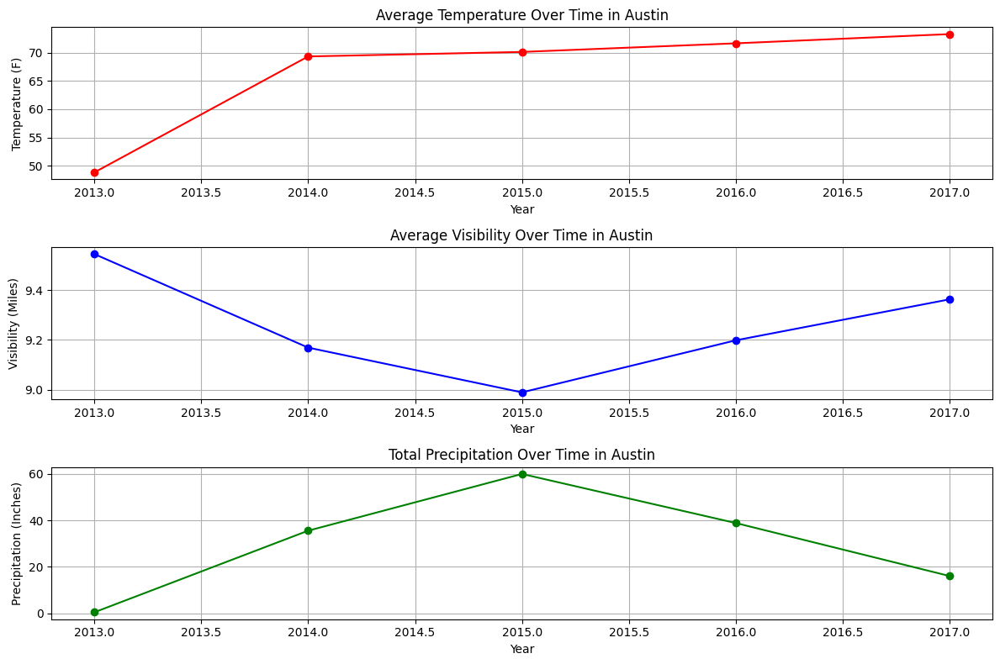

In [20]:
# Extract year for trend analysis
weather['Year'] = weather['Date'].dt.year

# Function to calculate yearly averages for specified columns
def calculate_yearly_avg(weather, column):
    return weather.groupby('Year')[column].mean()

# 1. Analyze measurable changes in temperature, visibility, and precipitation

# Calculate yearly averages for temperature, visibility, and precipitation
avg_temp = calculate_yearly_avg(weather, 'TempAvgF')
avg_visibility = calculate_yearly_avg(weather, 'VisibilityAvgMiles')
total_precipitation = weather.groupby('Year')['PrecipitationSumInches'].sum()

# Plot trends in temperature, visibility, and precipitation
plt.figure(figsize=(12, 8))

plt.subplot(3, 1, 1)
plt.plot(avg_temp.index, avg_temp.values, marker='o', label='Avg Temperature (F)', color='r')
plt.title('Average Temperature Over Time in Austin')
plt.xlabel('Year')
plt.ylabel('Temperature (F)')
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(avg_visibility.index, avg_visibility.values, marker='o', label='Avg Visibility (Miles)', color='b')
plt.title('Average Visibility Over Time in Austin')
plt.xlabel('Year')
plt.ylabel('Visibility (Miles)')
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(total_precipitation.index, total_precipitation.values, marker='o', label='Total Precipitation (Inches)', color='g')
plt.title('Total Precipitation Over Time in Austin')
plt.xlabel('Year')
plt.ylabel('Precipitation (Inches)')
plt.grid(True)

plt.tight_layout()
plt.show()

### Do you notice any correlation between any of the fields in the dataset? Can we use the observed correlation to make future predictions?
Strong correlation (not the variables share the same roots)
TempHighF and DewPointAvgF - Correlation: 0.81  
TempHighF and SeaLevelPressureHighInches - Correlation: -0.68  
TempAvgF and SeaLevelPressureHighInches - Correlation: -0.70  
DewPointAvgF and SeaLevelPressureAvgInches - Correlation: -0.63  
HumidityHighPercent and HumidityAvgPercent - Correlation: 0.82  

We can use the observed correlation to make future predictions after considering the causation relationship of the variables and some issues that may happen in the data itself.    
Overfitting and Generalization:
- Even if two variables are highly correlated in the dataset, this might not hold true for future data. For instance, weather patterns can change, and what worked well in the past may not work for future predictions due to changes in underlying factors (e.g., seasonality, climate change).
    
Multicollinearity:  
- If multiple variables in the dataset are highly correlated (like TempHighF and DewPointAvgF), this can lead to multicollinearity, where the model has difficulty determining which variable has the true effect on the target variable. This can reduce the reliability of predictions.

Conclusion: those high correlated variables can be candidate for inclusion in a predictive model (linear regression, boosted tree or random forest).  


In [91]:
# Compute correlation matrix
corr_matrix = weather.corr()

# Create an empty list to hold column pairs with high correlation
high_corr_pairs = []

# Iterate over the matrix to find pairs with correlation above 0.6
for i in range(len(corr_matrix.columns)):
    for j in range(i+1, len(corr_matrix.columns)):
        if abs(corr_matrix.iloc[i, j]) >= 0.6:  # absolute correlation >= 0.5
            col_pair = (corr_matrix.columns[i], corr_matrix.columns[j], corr_matrix.iloc[i, j])
            high_corr_pairs.append(col_pair)

# Print the results
for pair in high_corr_pairs:
    print(f"Pair: {pair[0]} and {pair[1]} - Correlation: {pair[2]:.2f}")

Pair: TempHighF and TempAvgF - Correlation: 0.97
Pair: TempHighF and TempLowF - Correlation: 0.88
Pair: TempHighF and DewPointHighF - Correlation: 0.81
Pair: TempHighF and DewPointAvgF - Correlation: 0.81
Pair: TempHighF and DewPointLowF - Correlation: 0.76
Pair: TempHighF and SeaLevelPressureHighInches - Correlation: -0.68
Pair: TempHighF and SeaLevelPressureAvgInches - Correlation: -0.62
Pair: TempAvgF and TempLowF - Correlation: 0.97
Pair: TempAvgF and DewPointHighF - Correlation: 0.88
Pair: TempAvgF and DewPointAvgF - Correlation: 0.90
Pair: TempAvgF and DewPointLowF - Correlation: 0.86
Pair: TempAvgF and SeaLevelPressureHighInches - Correlation: -0.70
Pair: TempAvgF and SeaLevelPressureAvgInches - Correlation: -0.62
Pair: TempLowF and DewPointHighF - Correlation: 0.90
Pair: TempLowF and DewPointAvgF - Correlation: 0.93
Pair: TempLowF and DewPointLowF - Correlation: 0.92
Pair: TempLowF and SeaLevelPressureHighInches - Correlation: -0.67
Pair: DewPointHighF and DewPointAvgF - Correl

C:\Users\Asus-Pro\AppData\Local\Temp\ipykernel_8784\3201314706.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = weather.corr()


In [21]:
# EDA
from dataprep.eda import create_report, plot

In [22]:
# weather.to_csv("austin_weather_update.csv", index=False)

  0%|                                                                                         | 0/4110 [00:00<…

C:\Users\Asus-Pro\AppData\Roaming\Python\Python39\site-packages\dask\core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Asus-Pro\AppData\Roaming\Python\Python39\site-packages\dask\core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))
C:\Users\Asus-Pro\AppData\Roaming\Python\Python39\site-packages\dataprep\eda\distribution\render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'SeaLevelPress...hes'
E-1019 (DUPLICATE_FACTORS): FactorRange must specify a unique list of categorical factors for an axis: duplicate factors found: 'SeaLevelPress...hes'
E-1019

DataPrep Report
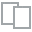
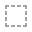
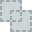
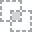
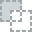
...
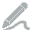
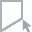
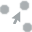
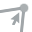
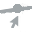

In [23]:
# REPORT of DATA
report = create_report(weather)
report

### Based on the data, what trends do you notice, and what predictions can you make for Austin’s climate in the future?
For the trend   
- The average temperature tends to rise over 4 years
- Precipitation saw its peak in 2015, then the amount of rain each year declines gradually. Compared to its starting point, still an upward trends
- For the visibility, after a huge fall from 2013-2015, increase back again

Prediction (based on charts and logical reasoning from facts, not yet take into account other metrics and variables):
- as in the chart, the average temperature will continue to rise
- The rise in temperature may lead to higher rainfall, but that's not always the case (as in the charts)
- If rainfall increase, then visibility will decrease (matter of fact)

### TempAvgF

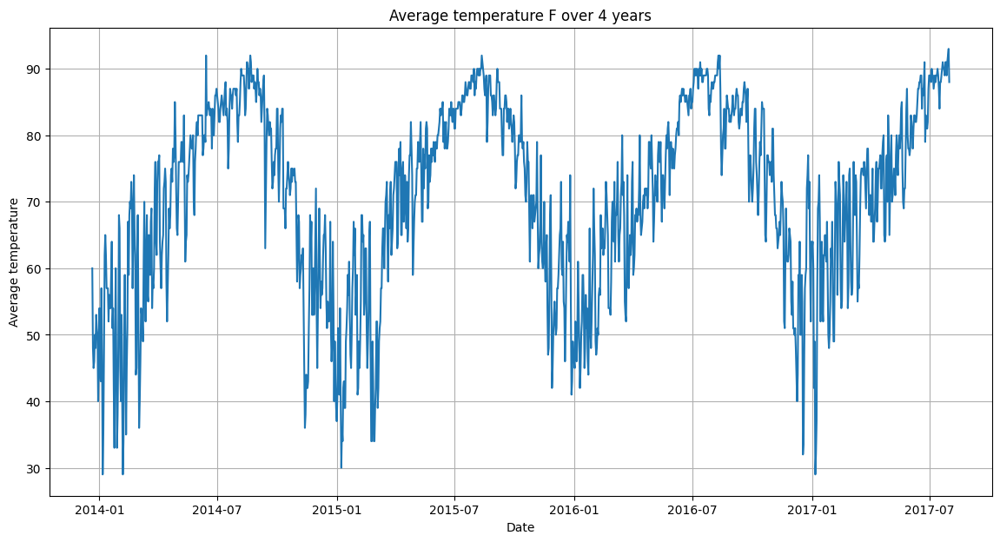

In [24]:
# Trực quan hóa dữ liệu Avg Temp F bằng biểu đồ line plot
plt.figure(figsize=(14, 7))
sns.lineplot(x='Date', y='TempAvgF', data=weather)
plt.title('Average temperature F over 4 years')
plt.xlabel('Date')
plt.ylabel('Average temperature')
plt.grid(True)
plt.show()

# ARIMA predictive model

In [25]:
# Đọc dữ liệu từ file CSV
file_path = 'temp 180 forecast.csv'
data = pd.read_csv(file_path)

data.head()

,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,residual
0,2013-12-21 00:00:00.000000 UTC,history,60.0,60.000000,3.338775,NaN,NaN,NaN,0.000000,-13.940543,NaN,NaN,7.594971,NaN,NaN,0.0,NaN,66.345572
1,2013-12-22 00:00:00.000000 UTC,history,48.0,54.687900,3.338775,NaN,NaN,NaN,66.350065,-13.214648,NaN,NaN,1.552483,NaN,NaN,0.0,NaN,-6.687900
2,2013-12-23 00:00:00.000000 UTC,history,45.0,43.501476,3.338775,NaN,NaN,NaN,60.601897,-14.054678,NaN,NaN,-3.045743,NaN,NaN,0.0,NaN,1.498524
3,2013-12-24 00:00:00.000000 UTC,history,46.0,46.669486,3.338775,NaN,NaN,NaN,65.570701,-13.777863,NaN,NaN,-5.123352,NaN,NaN,0.0,NaN,-0.669486
4,2013-12-25 00:00:00.000000 UTC,history,50.0,49.222009,3.338775,NaN,NaN,NaN,62.363604,-12.118105,NaN,NaN,-1.023490,NaN,NaN,0.0,NaN,0.777991


In [26]:
data["time_series_type"].value_counts()

history     1319
forecast     180
Name: time_series_type, dtype: int64

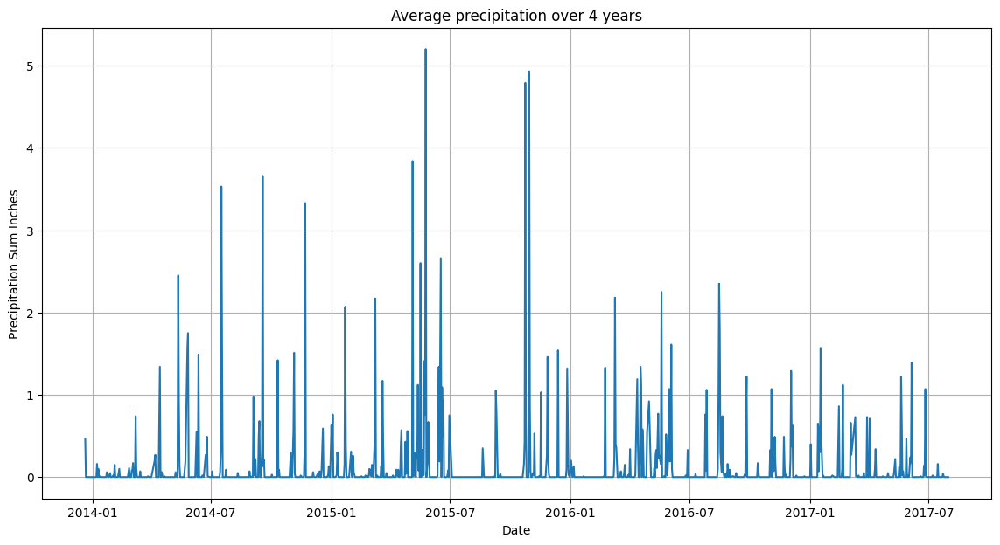

In [27]:
# Trực quan hóa dữ liệu Avg Temp F bằng biểu đồ line plot
plt.figure(figsize=(14, 7))
sns.lineplot(x='Date', y='PrecipitationSumInches', data=weather)
plt.title('Average precipitation over 4 years')
plt.xlabel('Date')
plt.ylabel('Precipitation Sum Inches')
plt.grid(True)
plt.show()

In [28]:
forecast = pd.read_csv('temp 180 forecast.csv')
forecast.head()

,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,residual
0,2013-12-21 00:00:00.000000 UTC,history,60.0,60.000000,3.338775,NaN,NaN,NaN,0.000000,-13.940543,NaN,NaN,7.594971,NaN,NaN,0.0,NaN,66.345572
1,2013-12-22 00:00:00.000000 UTC,history,48.0,54.687900,3.338775,NaN,NaN,NaN,66.350065,-13.214648,NaN,NaN,1.552483,NaN,NaN,0.0,NaN,-6.687900
2,2013-12-23 00:00:00.000000 UTC,history,45.0,43.501476,3.338775,NaN,NaN,NaN,60.601897,-14.054678,NaN,NaN,-3.045743,NaN,NaN,0.0,NaN,1.498524
3,2013-12-24 00:00:00.000000 UTC,history,46.0,46.669486,3.338775,NaN,NaN,NaN,65.570701,-13.777863,NaN,NaN,-5.123352,NaN,NaN,0.0,NaN,-0.669486
4,2013-12-25 00:00:00.000000 UTC,history,50.0,49.222009,3.338775,NaN,NaN,NaN,62.363604,-12.118105,NaN,NaN,-1.023490,NaN,NaN,0.0,NaN,0.777991


### Plot a graph showing the trend and predictive dataset of average temperatures in Austin, using mean groups by month

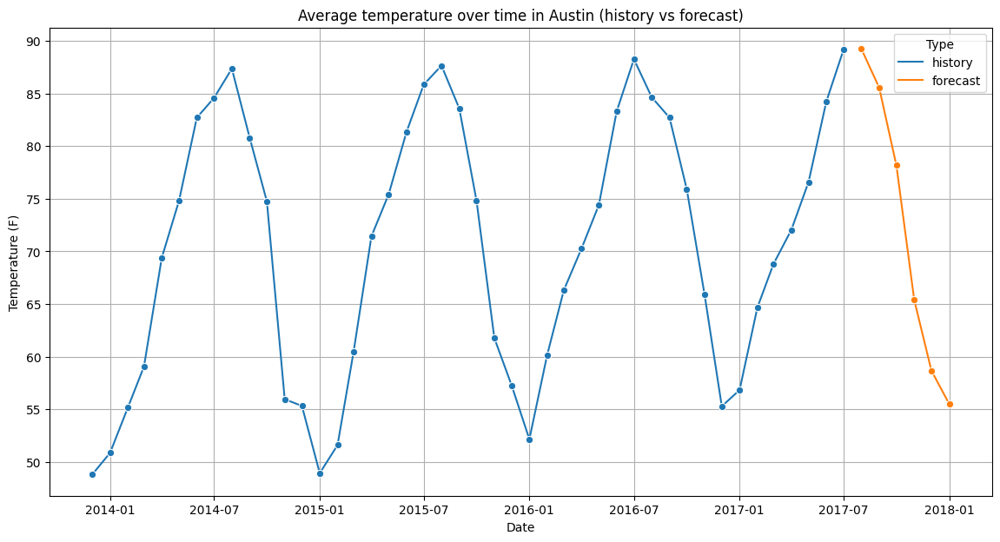

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert timestamp column to datetime format
data['time_series_timestamp'] = pd.to_datetime(data['time_series_timestamp'])

# Extract year and month for more specific grouping
data['Year'] = data['time_series_timestamp'].dt.year
data['Month'] = data['time_series_timestamp'].dt.month

# Calculate monthly averages for each type and year
monthly_avg_temp = data.groupby(['Year', 'Month', 'time_series_type'])['time_series_data'].mean().reset_index()

# Create a datetime column for plotting purposes
monthly_avg_temp['Date'] = pd.to_datetime(monthly_avg_temp[['Year', 'Month']].assign(DAY=1))

# Plot the trend of average temperature over time with history and forecast
plt.figure(figsize=(14, 7))

# Plotting historical and forecasted average temperatures with hue
sns.lineplot(x='Date', y='time_series_data', hue='time_series_type', 
             data=monthly_avg_temp, marker='o', palette='tab10')

plt.title('Average temperature over time in Austin (history vs forecast)')
plt.xlabel('Date')
plt.ylabel('Temperature (F)')
plt.grid(True)
plt.legend(title='Type')
plt.show()


In [69]:
prec = pd.read_csv('precipitation 180 forecast.csv')
prec.head()

,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,residual
0,2013-12-21 00:00:00.000000 UTC,history,0.46,0.432029,0.042771,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,0.072934,NaN,NaN,0.0,0.027971,0.359094
1,2013-12-22 00:00:00.000000 UTC,history,0.00,0.324618,0.042771,NaN,NaN,NaN,0.359094,NaN,NaN,NaN,-0.034477,NaN,NaN,0.0,0.027971,-0.352589
2,2013-12-23 00:00:00.000000 UTC,history,0.00,0.052859,0.042771,NaN,NaN,NaN,0.082840,NaN,NaN,NaN,-0.029981,NaN,NaN,0.0,0.027971,-0.080831
3,2013-12-24 00:00:00.000000 UTC,history,0.00,0.072024,0.042771,NaN,NaN,NaN,0.095856,NaN,NaN,NaN,-0.023832,NaN,NaN,0.0,0.027971,-0.099995
4,2013-12-25 00:00:00.000000 UTC,history,0.00,0.060383,0.042771,NaN,NaN,NaN,0.044956,NaN,NaN,NaN,0.015427,NaN,NaN,0.0,0.027971,-0.088354


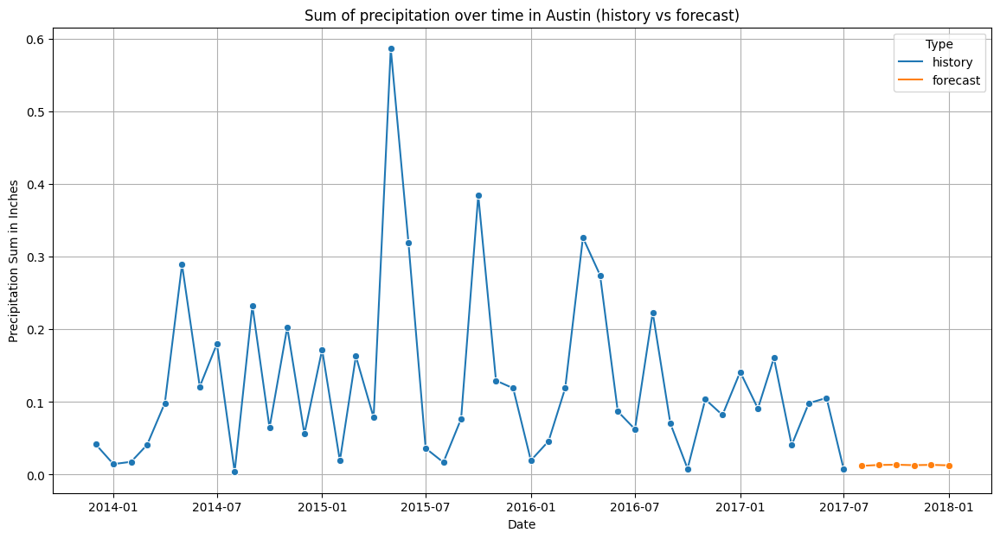

In [74]:
# Convert timestamp column to datetime format
prec['time_series_timestamp'] = pd.to_datetime(prec['time_series_timestamp'])

# Extract year and month for more specific grouping
prec['Year'] = prec['time_series_timestamp'].dt.year
prec['Month'] = prec['time_series_timestamp'].dt.month

# Calculate monthly averages for each type and year
monthly_avg_prec = prec.groupby(['Year', 'Month', 'time_series_type'])['time_series_data'].mean().reset_index()

# Create a datetime column for plotting purposes
monthly_avg_prec['Date'] = pd.to_datetime(monthly_avg_prec[['Year', 'Month']].assign(DAY=1))

# Plot the trend of average temperature over time with history and forecast
plt.figure(figsize=(14, 7))

# Plotting historical and forecasted average temperatures with hue
sns.lineplot(x='Date', y='time_series_data', hue='time_series_type', 
             data=monthly_avg_prec, marker='o', palette='tab10')

plt.title('Sum of precipitation over time in Austin (history vs forecast)')
plt.xlabel('Date')
plt.ylabel('Precipitation Sum in Inches')
plt.grid(True)
plt.legend(title='Type')
plt.show()


In [87]:
vis = pd.read_csv('visi 180 forecast.csv')
vis.head()

,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,seasonal_period_yearly,seasonal_period_quarterly,seasonal_period_monthly,seasonal_period_weekly,seasonal_period_daily,holiday_effect,spikes_and_dips,step_changes,residual
0,2013-12-21 00:00:00.000000 UTC,history,7.0,7.000000,1.052101,NaN,NaN,NaN,9.317435,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,-2.317435
1,2013-12-22 00:00:00.000000 UTC,history,10.0,8.317979,1.052101,NaN,NaN,NaN,8.317979,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.682021
2,2013-12-23 00:00:00.000000 UTC,history,10.0,9.384803,1.052101,NaN,NaN,NaN,9.384803,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.615197
3,2013-12-24 00:00:00.000000 UTC,history,10.0,9.598857,1.052101,NaN,NaN,NaN,9.598857,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.401143
4,2013-12-25 00:00:00.000000 UTC,history,10.0,9.642298,1.052101,NaN,NaN,NaN,9.642298,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.357702


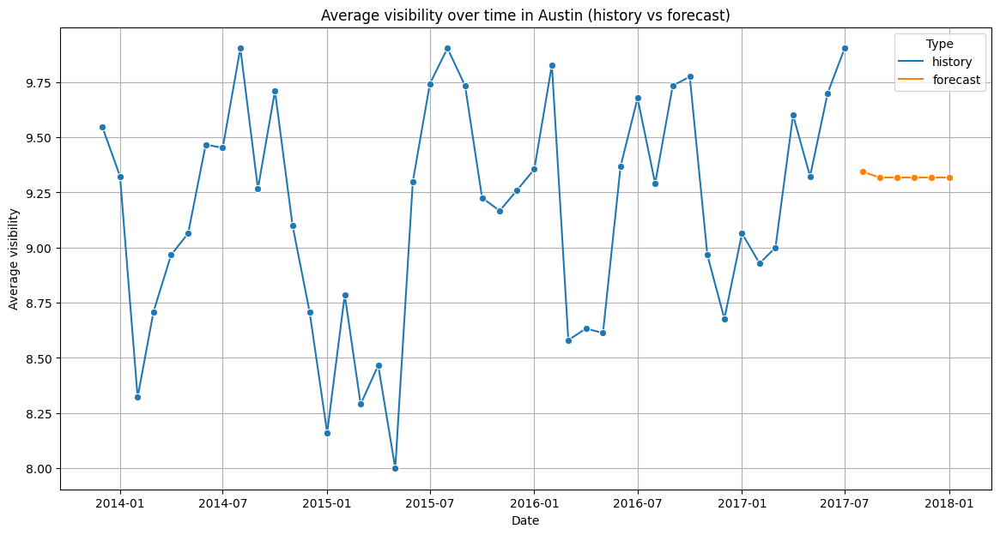

In [89]:
# Convert timestamp column to datetime format
vis['time_series_timestamp'] = pd.to_datetime(vis['time_series_timestamp'])

# Extract year and month for more specific grouping
vis['Year'] = vis['time_series_timestamp'].dt.year
vis['Month'] = vis['time_series_timestamp'].dt.month

# Calculate monthly averages for each type and year
monthly_avg_vis = vis.groupby(['Year', 'Month', 'time_series_type'])['time_series_data'].mean().reset_index()

# Create a datetime column for plotting purposes
monthly_avg_vis['Date'] = pd.to_datetime(monthly_avg_vis[['Year', 'Month']].assign(DAY=1))

# Plot the trend of average temperature over time with history and forecast
plt.figure(figsize=(14, 7))

# Plotting historical and forecasted average temperatures with hue
sns.lineplot(x='Date', y='time_series_data', hue='time_series_type', 
             data=monthly_avg_vis, marker='o', palette='tab10')

plt.title('Average visibility over time in Austin (history vs forecast)')
plt.xlabel('Date')
plt.ylabel('Average visibility')
plt.grid(True)
plt.legend(title='Type')
plt.show()
